In [12]:
from eykthyr.eykthyr.eykthyr import Eykthyr, load_anndata
import scanpy as sc
from eykthyr.eykthyr import pl
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# slidetags

In [2]:
e = Eykthyr()

In [3]:
adrna = sc.read('processed_data/slidetags_multiome_rna_subset.h5ad')
adrna

AnnData object with n_obs × n_vars = 2535 × 36601
    obs: 'cell_type'
    var: 'gene_ids', 'feature_types'
    obsm: 'spatial'

In [4]:
e.set_RNA([adrna])

/work/magroup/skrieger/newconda/envs/tangram3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/work/magroup/skrieger/newconda/envs/tangram3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


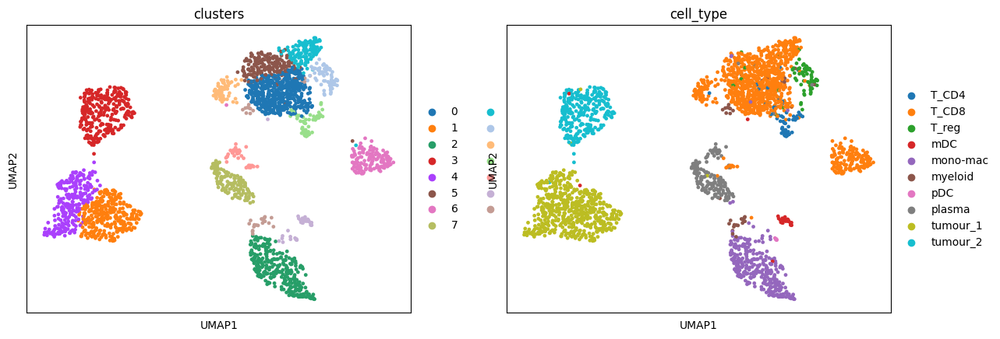

In [5]:
e.preprocess_rna(make_plots=True, cluster_annotation=['cell_type'])

In [6]:
e.datasetnames = ['eykthyr_dataset']

In [7]:
e.compute_metagenes()

[AnnData object with n_obs × n_vars = 2535 × 22446
    obs: 'cell_type', 'n_counts', 'clusters', 'adjacency_list'
    var: 'gene_ids', 'feature_types', 'n_cells'
    uns: 'log1p', 'pca', 'neighbors', 'umap', 'leiden', 'clusters_colors', 'cell_type_colors'
    obsm: 'spatial', 'X_umap'
    varm: 'PCs'
    layers: 'raw'
    obsp: 'distances', 'connectivities', 'adjacency_matrix']


/work/magroup/skrieger/newconda/envs/tangram3/lib/python3.8/site-packages/popari/util.py:500: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at  ../torch/csrc/utils/tensor_new.cpp:201.)
  i = torch.LongTensor(indices)


/work/magroup/skrieger/newconda/envs/tangram3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/work/magroup/skrieger/newconda/envs/tangram3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


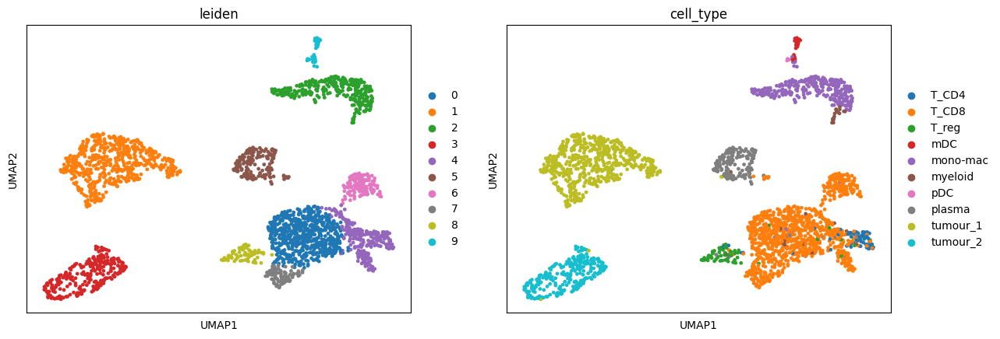

In [8]:
e.analyze_metagenes()

In [14]:
e.compute_TF_activity(peak_tsvs=['data/slidetags_multiome/slidetags_multiome_peaks.tsv'],
                      archr_dataset_names=['slidetags_multiome'],
                      motif_tsvs=['data/slidetags_multiome/slidetags_multiome_motifs.tsv'],
                     archr_suffix='-1')

In [15]:
e.compute_TF_metagene_weights()

2535it [01:08, 37.08it/s]
2535it [01:07, 37.32it/s]
2535it [01:08, 37.05it/s]
2535it [01:08, 36.83it/s]
2535it [01:08, 36.92it/s]
2535it [01:07, 37.67it/s]
2535it [01:06, 38.34it/s]
2535it [01:05, 38.41it/s]
2535it [01:06, 38.41it/s]
2535it [01:07, 37.52it/s]
2535it [01:07, 37.43it/s]
2535it [01:06, 37.88it/s]
2535it [01:07, 37.81it/s]
2535it [01:07, 37.31it/s]
2535it [01:06, 38.21it/s]
2535it [01:08, 37.26it/s]


In [16]:
e.save_anndata('eykthyrtest.h5ad')

In [17]:
e2 = load_anndata('eykthyrtest.h5ad')

[2024/11/04 15:55:12]	 Reloading level 0


In [18]:
e.run_all_perturbations()

870it [03:22,  4.30it/s]


In [19]:
e.save_anndata('eykthyrtest.h5ad')

# Plotting

In [4]:
e = load_anndata('eykthyrtest.h5ad')

/work/magroup/skrieger/newconda/envs/tangram3/lib/python3.8/site-packages/popari/util.py:500: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at  ../torch/csrc/utils/tensor_new.cpp:201.)
  i = torch.LongTensor(indices)


[2024/08/07 09:54:48]	 Initializing MetageneState
[2024/08/07 09:54:48]	 Initializing SpatialAffinityState
[2024/08/07 09:54:48]	 Initializing EmbeddingOptimizer
[2024/08/07 09:54:48]	 Initializing EmbeddingState
[2024/08/07 09:54:49]	 Reloading level 0
[2024/08/07 09:54:49]	 Initializing MetageneState
[2024/08/07 09:54:49]	 Initializing SpatialAffinityState
[2024/08/07 09:54:49]	 Initializing EmbeddingOptimizer
[2024/08/07 09:54:49]	 Initializing EmbeddingState


/work/magroup/skrieger/newconda/envs/tangram3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


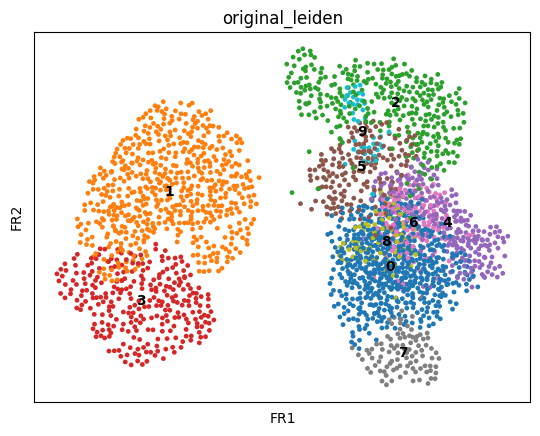

In [20]:
pl.prep_paga(e, 'original_leiden')

/work/magroup/skrieger/newconda/envs/tangram3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


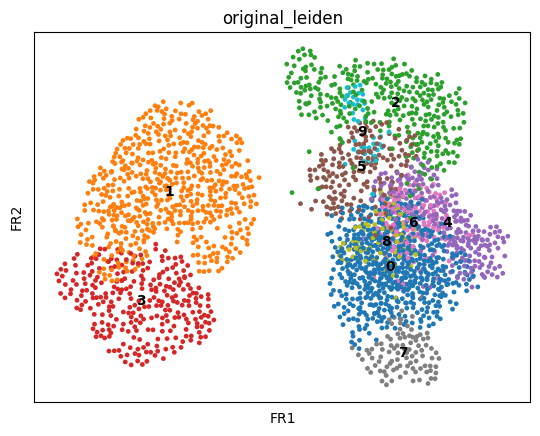

In [24]:
%matplotlib inline
sc.pl.draw_graph(e.perturbed_X[0], color='original_leiden', legend_loc='on data')

In [25]:
e.perturbed_X[0].obsm['spatial_scaled'] = (e.perturbed_X[0].obsm['spatial'] - e.perturbed_X[0].obsm['spatial'].
                                        min()) / e.perturbed_X[0].obsm['spatial'].max() * 100

In [26]:
e.perturbed_X[0].obsm['spatial'] = e.perturbed_X[0].obsm['spatial_scaled']

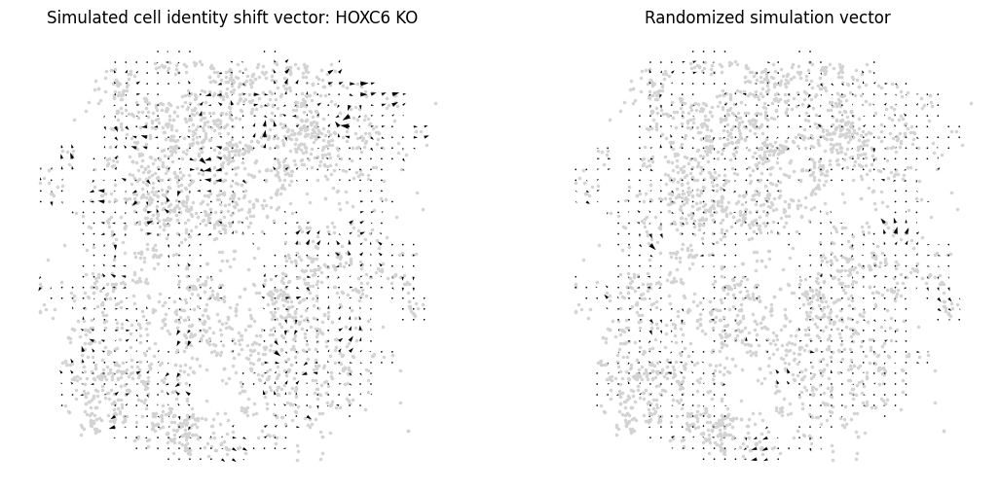

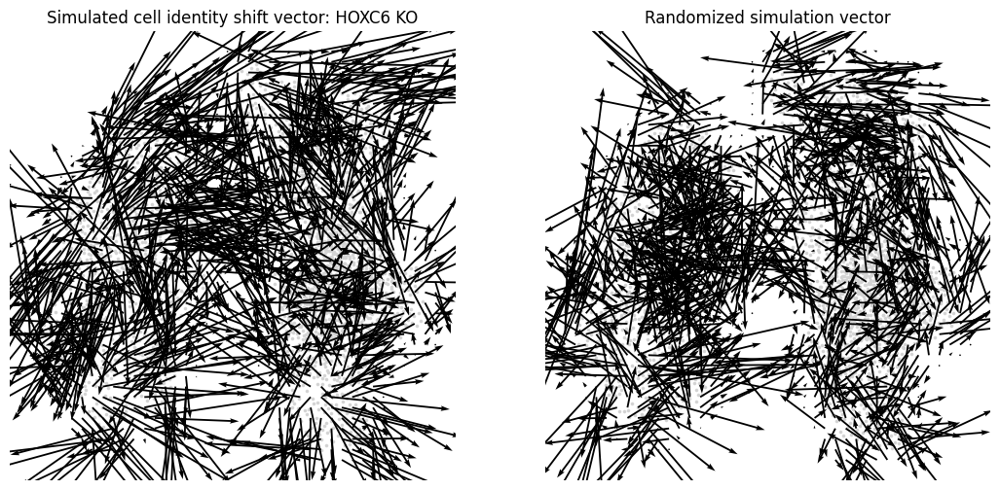

0
0


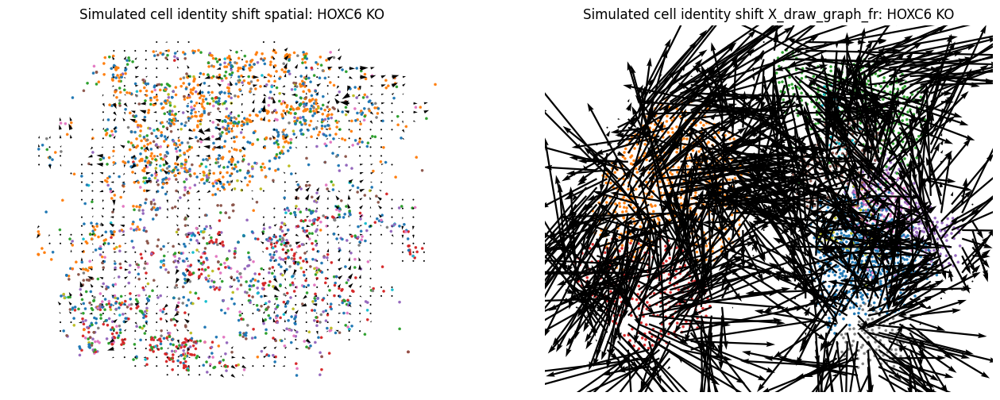

In [27]:
pl.paga_spatial_simulation(e, ['HOXC6'], 'original_leiden')

# spatial ATAC-RNA

In [28]:
e = Eykthyr()

In [29]:
adrna = sc.read('data/spatialatacrna/mouse_embryo2_rna.h5ad')
adrna

AnnData object with n_obs × n_vars = 2187 × 20900
    obsm: 'spatial'

In [30]:
e.set_RNA([adrna])

/work/magroup/skrieger/newconda/envs/tangram3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


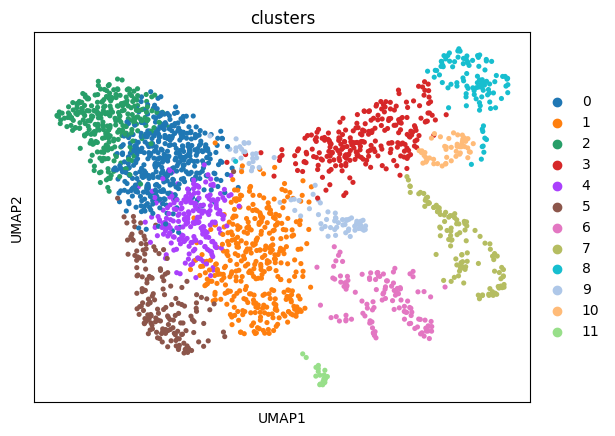

In [31]:
e.preprocess_rna(make_plots=True)

In [ ]:
e.compute_metagenes()

[AnnData object with n_obs × n_vars = 2187 × 15748
    obs: 'n_counts', 'clusters', 'adjacency_list'
    var: 'n_cells'
    uns: 'log1p', 'pca', 'neighbors', 'umap', 'leiden', 'clusters_colors'
    obsm: 'spatial', 'X_umap'
    varm: 'PCs'
    layers: 'raw'
    obsp: 'distances', 'connectivities', 'adjacency_matrix']


In [ ]:
e.analyze_metagenes()

In [ ]:
e.compute_TF_activity(peak_tsvs=['data/spatialatacrna/spatialATACRNAmouseembryo2_peaks.tsv'],
                      archr_dataset_names=['spatialATACRNAmouseembryo2'],
                      motif_tsvs=['data/spatialatacrna/spatialATACRNAmouseembryo2_motifs.tsv'])

In [ ]:
e.compute_TF_metagene_weights()

In [ ]:
e.run_all_perturbations()

In [ ]:
e.save_anndata('eykthyrtest2.h5ad')

In [26]:
e2 = load_anndata('eykthyrtest2.h5ad')

[2024/08/20 11:49:13]	 Reloading level 0


In [ ]:
pl.prep_paga(e, 'original_leiden')

In [ ]:
pl.paga_spatial_simulation(e, ['Msx1'], 'original_leiden')

In [ ]:
sc.pp.neighbors(e.perturbed_X[0], use_rep='spatial', key_added='spatial_neighbors')
nns = sc.Neighbors(e.perturbed_X[0], neighbors_key='spatial_neighbors')
nns.compute_neighbors(knn=False, use_rep='spatial', method='gauss')
ventricle_cells = e.perturbed_X[0][e.perturbed_X[0].obs['original_leiden'] == '7']
e.perturbed_X[0].obs['ventricle_distance'] = nns.distances[:,e.perturbed_X[0].obs['original_leiden'] == '7'].min(axis=1)

In [ ]:
ips = pl.development_simulation(e, ['Msx1'])

# MISAR

In [16]:
e = Eykthyr()

In [17]:
samplenames = ['E11_0-S1','E13_5-S1', 'E15_5-S2', 'E18_5-S1']
adrna = [sc.read(f'processed_data/cellOracle_misar_mouse_processed_{s}_noscale.h5ad') for s in samplenames]
adrna

[AnnData object with n_obs × n_vars = 732 × 23392
     obs: 'n_counts_all', 'louvain'
     var: 'gene_ids', 'feature_types', 'genome', 'n_counts'
     uns: 'diffmap_evals', 'draw_graph', 'log1p', 'louvain', 'louvain_colors', 'louvain_sizes', 'neighbors', 'paga', 'pca'
     obsm: 'X_diffmap', 'X_draw_graph_fr', 'X_pca', 'spatial'
     varm: 'PCs'
     layers: 'raw_count'
     obsp: 'connectivities', 'distances',
 AnnData object with n_obs × n_vars = 729 × 22710
     obs: 'n_counts_all', 'louvain'
     var: 'gene_ids', 'feature_types', 'genome', 'n_counts'
     uns: 'diffmap_evals', 'draw_graph', 'log1p', 'louvain', 'louvain_colors', 'louvain_sizes', 'neighbors', 'paga', 'pca'
     obsm: 'X_diffmap', 'X_draw_graph_fr', 'X_pca', 'spatial'
     varm: 'PCs'
     layers: 'raw_count'
     obsp: 'connectivities', 'distances',
 AnnData object with n_obs × n_vars = 1368 × 24149
     obs: 'n_counts_all', 'louvain'
     var: 'gene_ids', 'feature_types', 'genome', 'n_counts'
     uns: 'diffmap_eval

In [18]:
e.set_RNA(adrna)

/work/magroup/skrieger/newconda/envs/tangram3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/work/magroup/skrieger/newconda/envs/tangram3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


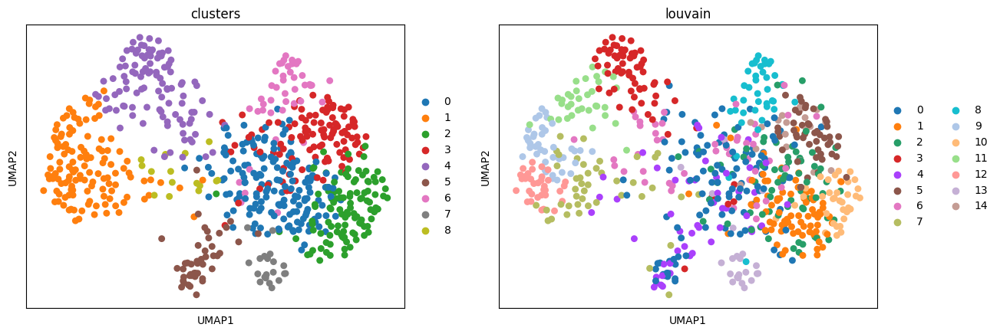

/work/magroup/skrieger/newconda/envs/tangram3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/work/magroup/skrieger/newconda/envs/tangram3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


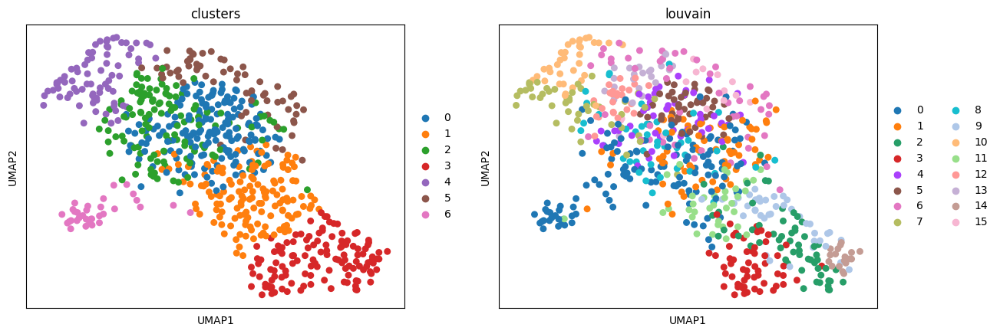

/work/magroup/skrieger/newconda/envs/tangram3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/work/magroup/skrieger/newconda/envs/tangram3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


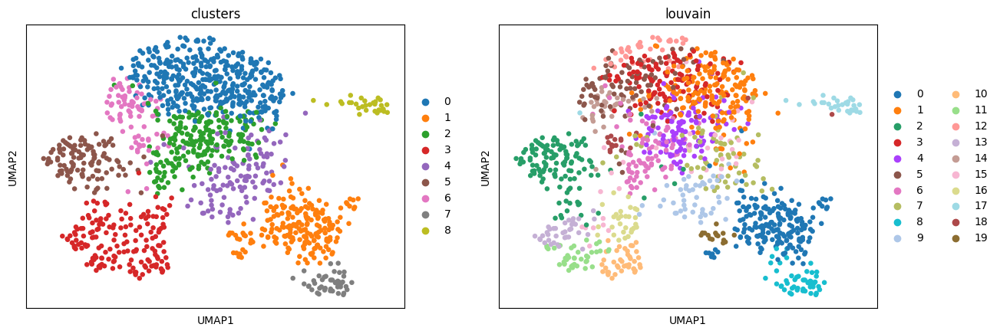

/work/magroup/skrieger/newconda/envs/tangram3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/work/magroup/skrieger/newconda/envs/tangram3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


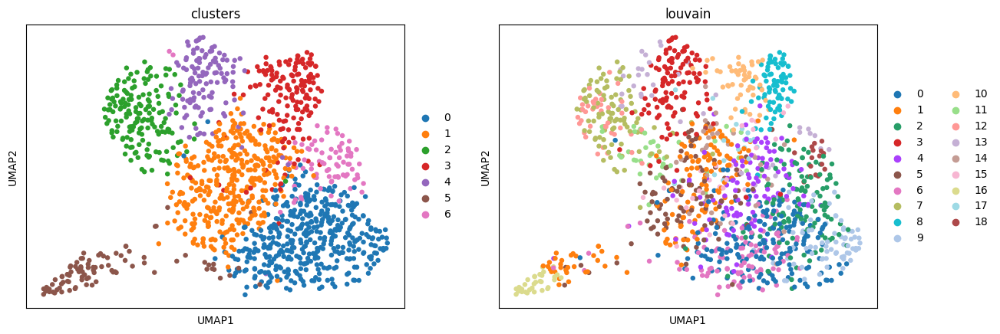

In [19]:
e.preprocess_rna(make_plots=True, cluster_annotation=['louvain'])

In [20]:
e.datasetnames = samplenames

In [21]:
e.compute_metagenes()

[AnnData object with n_obs × n_vars = 732 × 15468
    obs: 'n_counts_all', 'louvain', 'n_counts', 'clusters', 'adjacency_list'
    var: 'gene_ids', 'feature_types', 'genome', 'n_counts', 'n_cells'
    uns: 'diffmap_evals', 'draw_graph', 'log1p', 'louvain', 'louvain_colors', 'louvain_sizes', 'neighbors', 'paga', 'pca', 'umap', 'leiden', 'clusters_colors'
    obsm: 'X_draw_graph_fr', 'spatial', 'X_umap'
    varm: 'PCs'
    layers: 'raw_count', 'raw'
    obsp: 'connectivities', 'distances', 'adjacency_matrix', AnnData object with n_obs × n_vars = 729 × 15468
    obs: 'n_counts_all', 'louvain', 'n_counts', 'clusters', 'adjacency_list'
    var: 'gene_ids', 'feature_types', 'genome', 'n_counts', 'n_cells'
    uns: 'diffmap_evals', 'draw_graph', 'log1p', 'louvain', 'louvain_colors', 'louvain_sizes', 'neighbors', 'paga', 'pca', 'umap', 'leiden', 'clusters_colors'
    obsm: 'X_draw_graph_fr', 'spatial', 'X_umap'
    varm: 'PCs'
    layers: 'raw_count', 'raw'
    obsp: 'connectivities', 'distanc

/work/magroup/skrieger/newconda/envs/tangram3/lib/python3.8/site-packages/anndata/_core/anndata.py:1838: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


/work/magroup/skrieger/newconda/envs/tangram3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/work/magroup/skrieger/newconda/envs/tangram3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


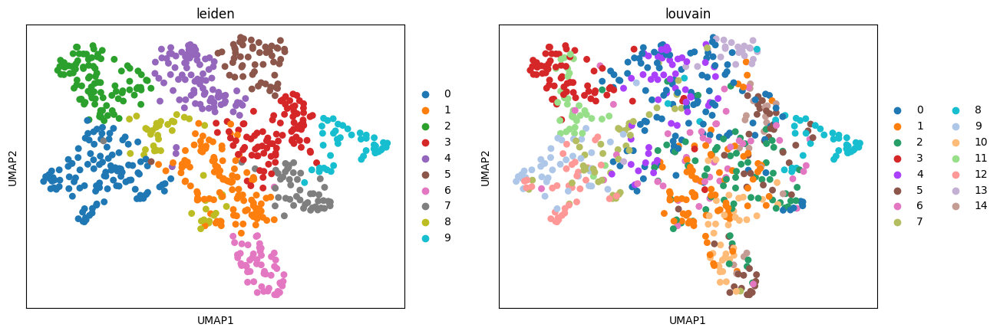

/work/magroup/skrieger/newconda/envs/tangram3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/work/magroup/skrieger/newconda/envs/tangram3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


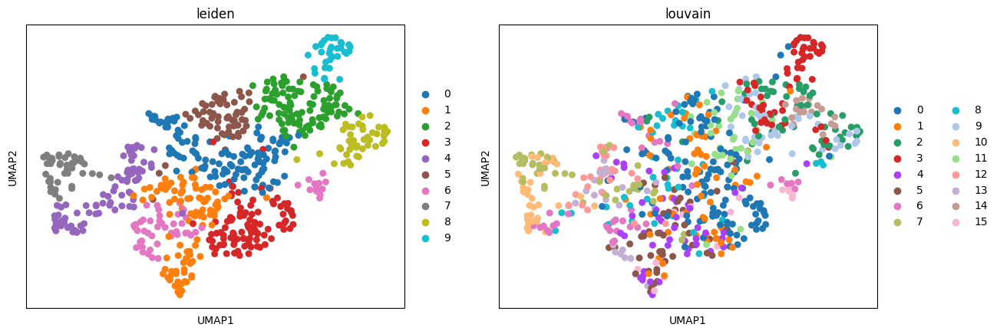

/work/magroup/skrieger/newconda/envs/tangram3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/work/magroup/skrieger/newconda/envs/tangram3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


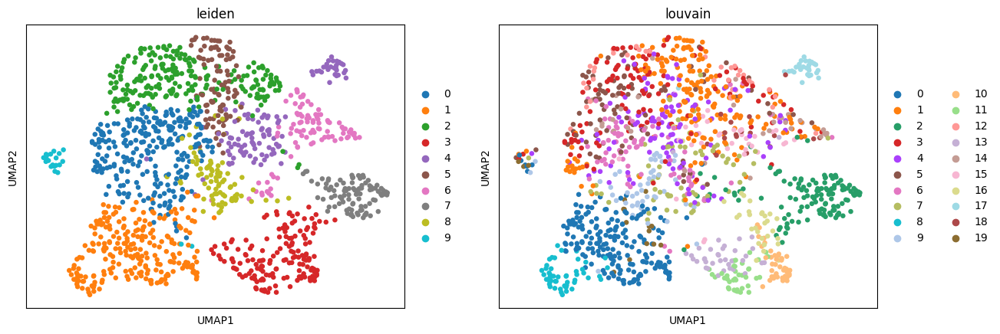

/work/magroup/skrieger/newconda/envs/tangram3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/work/magroup/skrieger/newconda/envs/tangram3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


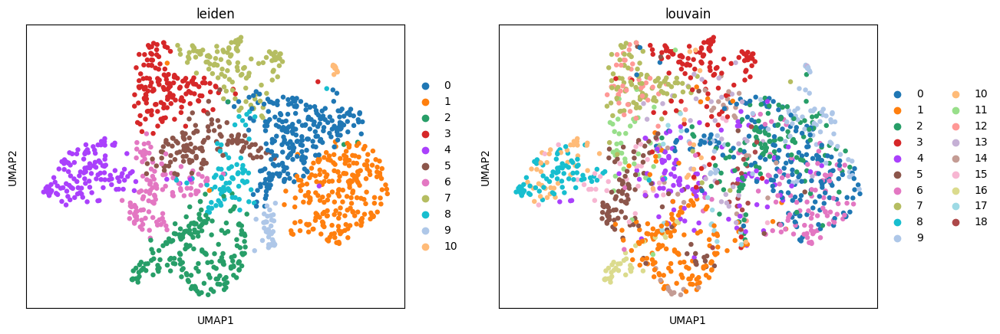

In [22]:
e.analyze_metagenes()

In [23]:
e.compute_TF_activity(peak_tsvs=[f'~/DEcausation/MISAR-seq/Data/{name}_peaks.tsv' for name in samplenames],
                      archr_dataset_names=samplenames,
                      motif_tsvs=[f'~/DEcausation/MISAR-seq/Data/{name}_motifs.tsv' for name in samplenames],)

/work/magroup/skrieger/newconda/envs/tangram3/lib/python3.8/site-packages/anndata/_core/anndata.py:1840: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/work/magroup/skrieger/newconda/envs/tangram3/lib/python3.8/site-packages/anndata/_core/anndata.py:1840: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/work/magroup/skrieger/newconda/envs/tangram3/lib/python3.8/site-packages/anndata/_core/anndata.py:1840: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/work/magroup/skrieger/newconda/envs/tangram3/lib/python3.8/site-packages/anndata/_core/anndata.py:1840: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [24]:
e.compute_TF_metagene_weights()

732it [00:16, 43.27it/s]
732it [00:16, 44.40it/s]
732it [00:16, 45.59it/s]
732it [00:16, 44.34it/s]
732it [00:16, 45.56it/s]
732it [00:17, 42.60it/s]
732it [00:15, 45.86it/s]
732it [00:15, 46.09it/s]
732it [00:15, 45.95it/s]
732it [00:16, 44.47it/s]
732it [00:17, 41.31it/s]
732it [00:17, 42.33it/s]
732it [00:16, 45.51it/s]
732it [00:16, 45.15it/s]
732it [00:16, 45.55it/s]
732it [00:16, 43.95it/s]
729it [00:16, 43.45it/s]
729it [00:16, 43.52it/s]
729it [00:15, 45.82it/s]
729it [00:15, 46.72it/s]
729it [00:16, 45.16it/s]
729it [00:16, 44.16it/s]
729it [00:16, 44.15it/s]
729it [00:17, 41.54it/s]
729it [00:15, 45.68it/s]
729it [00:16, 43.94it/s]
729it [00:16, 45.53it/s]
729it [00:15, 45.99it/s]
729it [00:16, 43.82it/s]
729it [00:17, 42.14it/s]
729it [00:15, 45.59it/s]
729it [00:16, 43.07it/s]
1368it [00:32, 42.15it/s]
1368it [00:33, 40.81it/s]
1368it [00:32, 42.54it/s]
1368it [00:33, 41.20it/s]
1368it [00:31, 42.92it/s]
1368it [00:33, 41.08it/s]
1368it [00:34, 39.71it/s]
1368it [00:32, 42.

In [25]:
e.save_anndata('eykthyrtest3.h5ad')

/work/magroup/skrieger/newconda/envs/tangram3/lib/python3.8/site-packages/anndata/_core/anndata.py:1838: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [26]:
e2 = load_anndata('eykthyrtest3.h5ad')

/work/magroup/skrieger/newconda/envs/tangram3/lib/python3.8/site-packages/anndata/_core/anndata.py:1838: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


[2024/08/19 16:24:46]	 Reloading level 0


In [35]:
e2.run_all_perturbations()

797it [00:37, 21.27it/s]
797it [00:35, 22.40it/s]
797it [01:18, 10.21it/s]
797it [01:22,  9.68it/s]


In [28]:
e2.save_anndata('eykthyrtest3.h5ad')

/work/magroup/skrieger/newconda/envs/tangram3/lib/python3.8/site-packages/anndata/_core/anndata.py:1838: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


# Plotting

In [29]:
e = load_anndata('eykthyrtest3.h5ad')

/work/magroup/skrieger/newconda/envs/tangram3/lib/python3.8/site-packages/anndata/_core/anndata.py:1838: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


[2024/08/19 16:29:31]	 Reloading level 0


KeyError: 'nll_embeddings'

/work/magroup/skrieger/newconda/envs/tangram3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


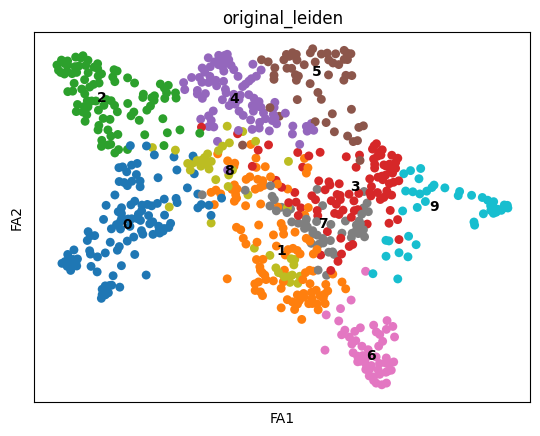

/work/magroup/skrieger/newconda/envs/tangram3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


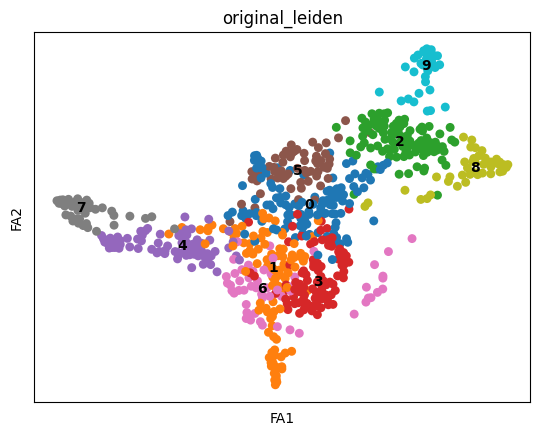

/work/magroup/skrieger/newconda/envs/tangram3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


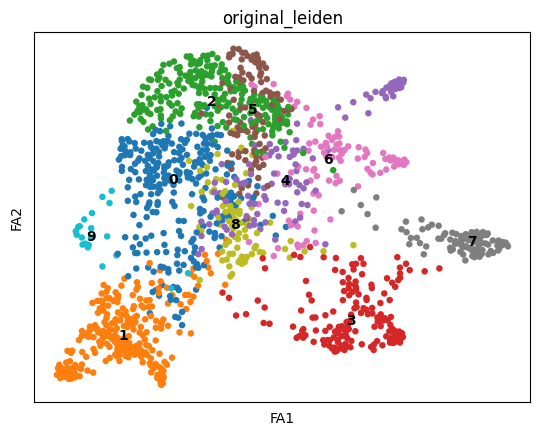

/work/magroup/skrieger/newconda/envs/tangram3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


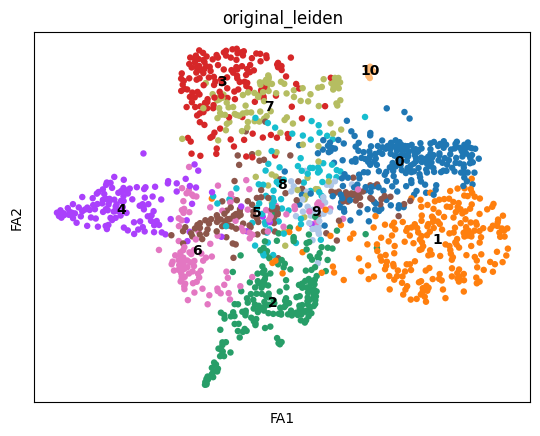

In [37]:
pl.prep_paga(e2, 'original_leiden')

/work/magroup/skrieger/newconda/envs/tangram3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


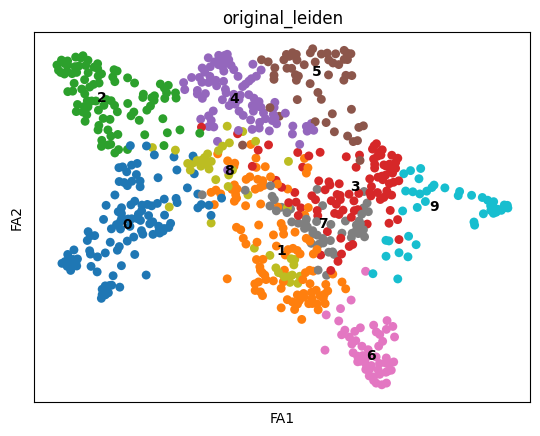

/work/magroup/skrieger/newconda/envs/tangram3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


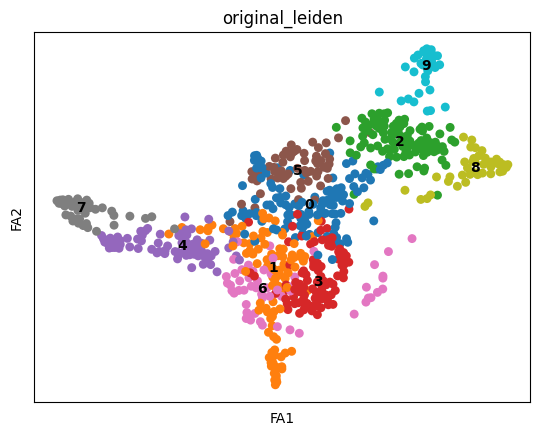

/work/magroup/skrieger/newconda/envs/tangram3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


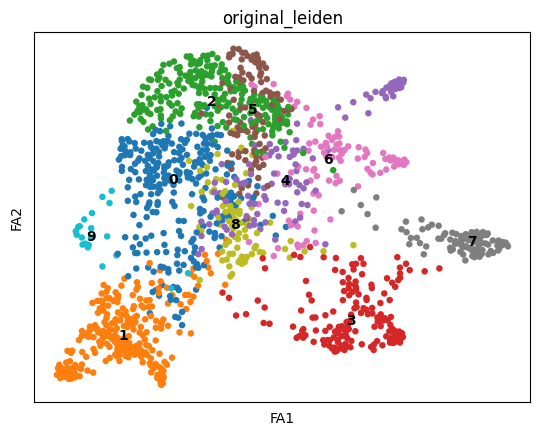

/work/magroup/skrieger/newconda/envs/tangram3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


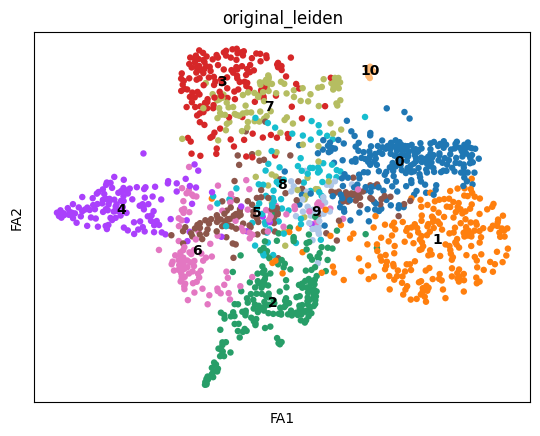

In [38]:
%matplotlib inline
for d in e2.perturbed_X:
    sc.pl.draw_graph(d, color='original_leiden', legend_loc='on data')

In [ ]:
# e.perturbed_X.obsm['spatial_scaled'] = (e.perturbed_X.obsm['spatial'] - e.perturbed_X.obsm['spatial'].
#                                         min()) / e.perturbed_X.obsm['spatial'].max() * 100

In [ ]:
# e.perturbed_X.obsm['spatial'] = e.perturbed_X.obsm['spatial_scaled']

In [36]:
e2.perturbed_X[0]

AnnData object with n_obs × n_vars = 732 × 15468
    obs: 'n_counts_all', 'louvain', 'n_counts', 'clusters', 'leiden', 'batch', 'adjacency_list', 'original_leiden'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'M', 'Sigma_x_inv', 'adjacency_matrix', 'draw_graph', 'leiden', 'log1p', 'losses', 'louvain', 'neighbors', 'norm_X_neighbors', 'paga', 'pca', 'popari_hyperparameters', 'umap', 'sigma_yx', 'dataset_name'
    obsm: 'X', 'X_draw_graph_fr', 'X_pca', 'X_umap', 'normalized_X', 'spatial', 'X_Tcfap2a_dropout', 'normalized_X_Tcfap2a_dropout', 'X_Tcfap2b_dropout', 'normalized_X_Tcfap2b_dropout', 'X_Tcfap2c_dropout', 'normalized_X_Tcfap2c_dropout', 'X_Tcfap2e_dropout', 'normalized_X_Tcfap2e_dropout', 'X_Tcfap2d_dropout', 'normalized_X_Tcfap2d_dropout', 'X_Arid3b_dropout', 'normalized_X_Arid3b_dropout', 'X_Arid3a_dropout', 'normalized_X_Arid3a_dropout', 'X_Arid5b_dropout', 'normalized_X_Arid5b_dropout', 'X_Arid5a_dropout', 'normalized_X_Arid5a_dropout', 'X_Arid3c_dropout', 'normali

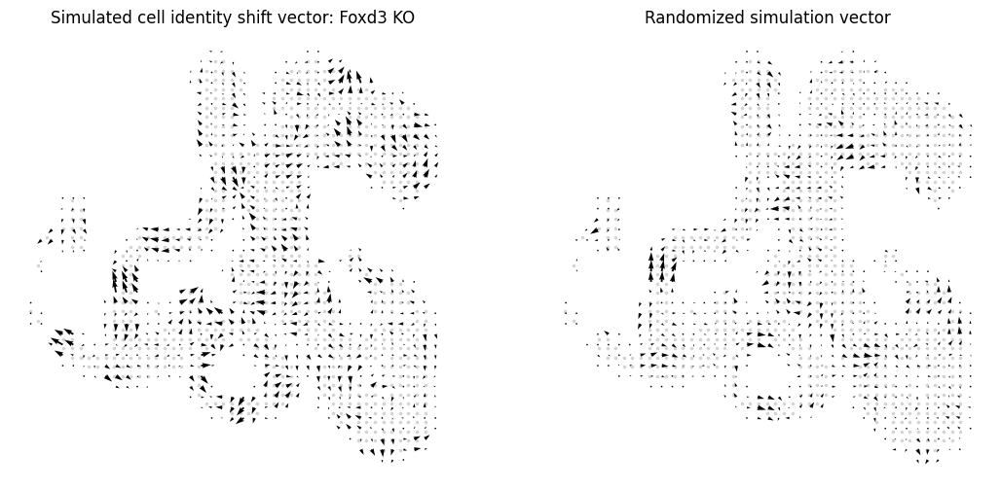

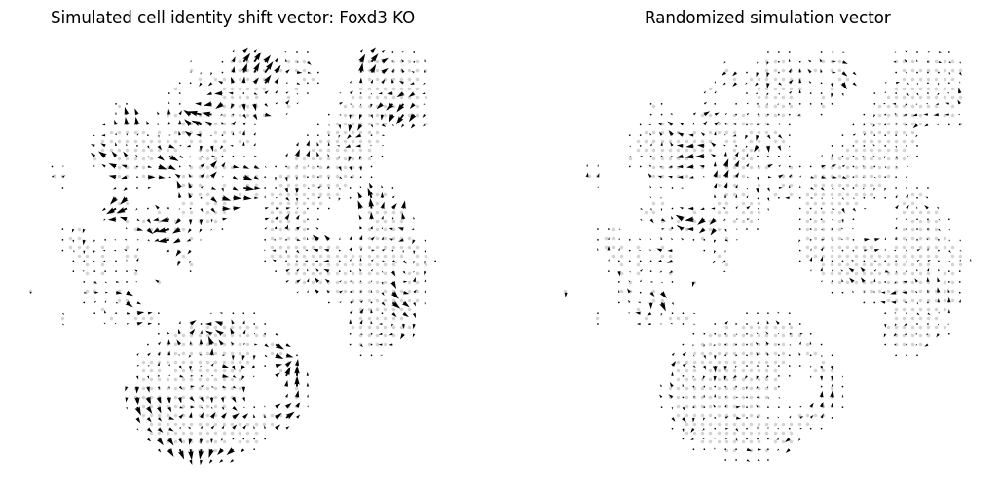

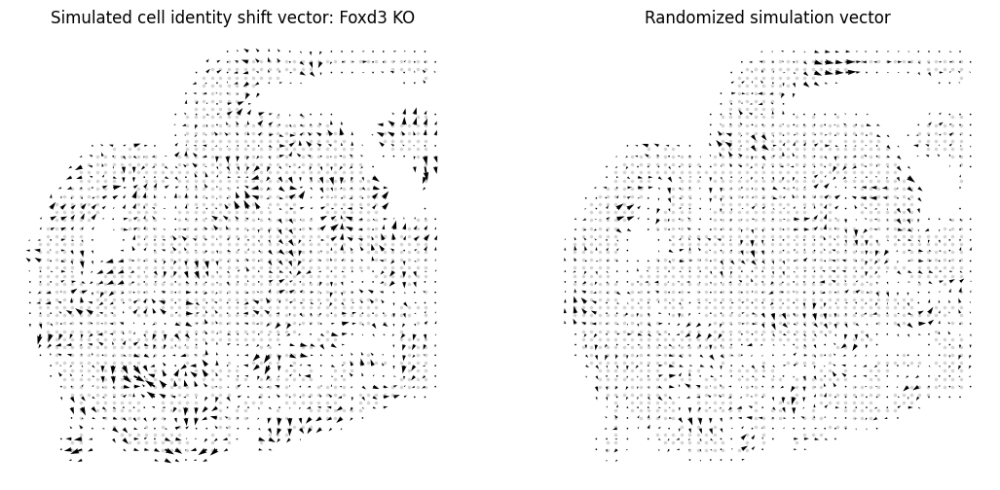

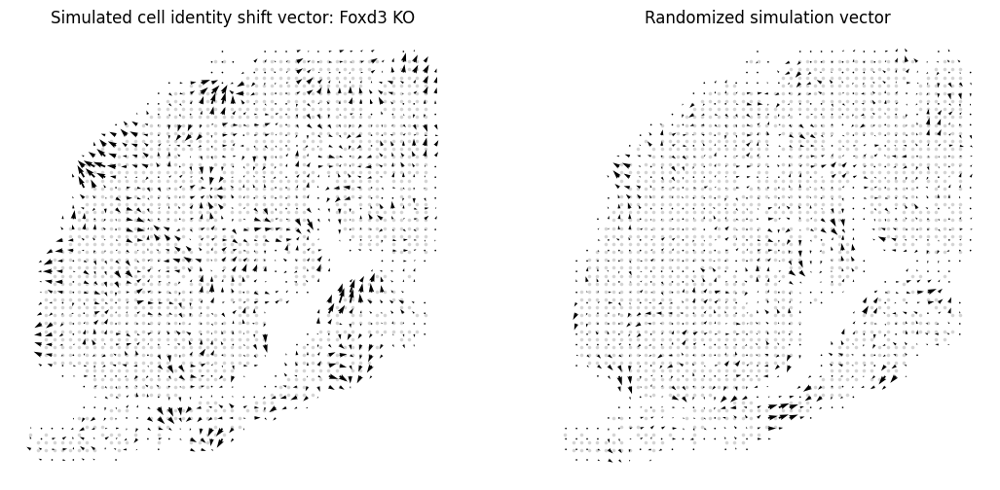

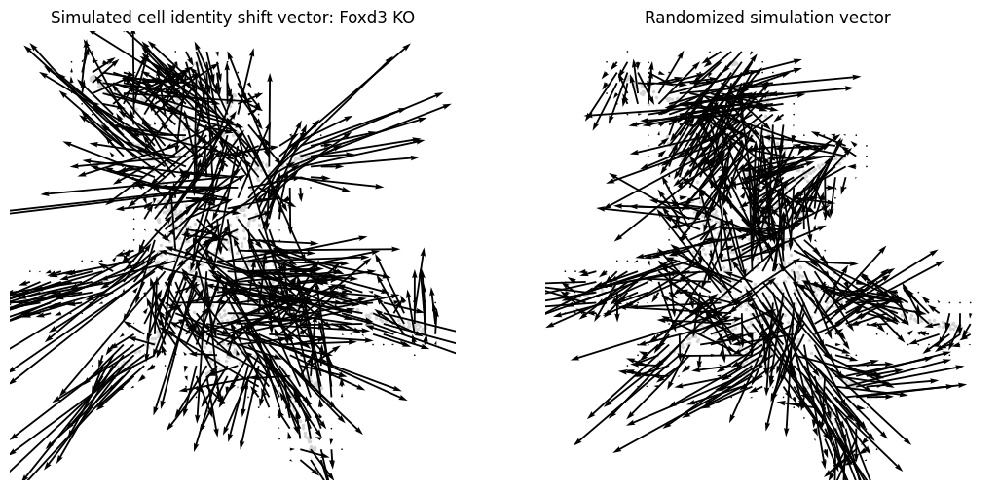

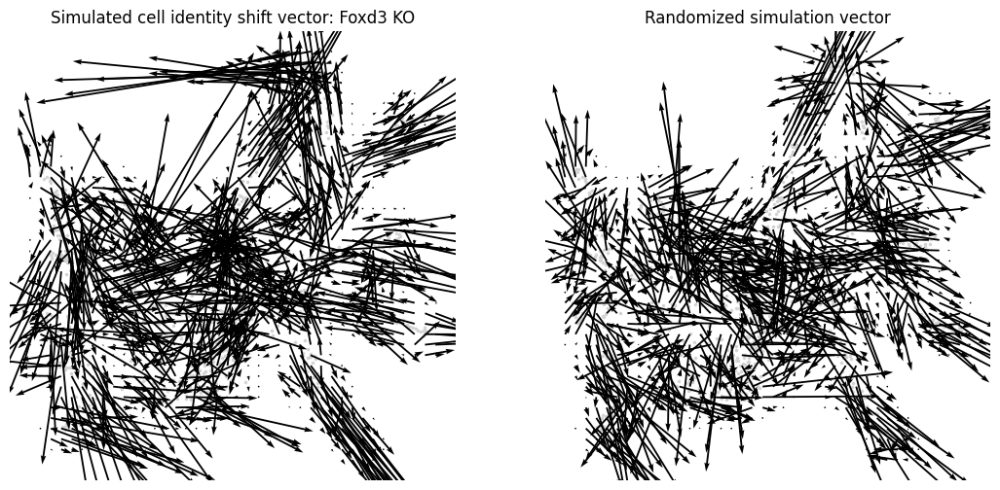

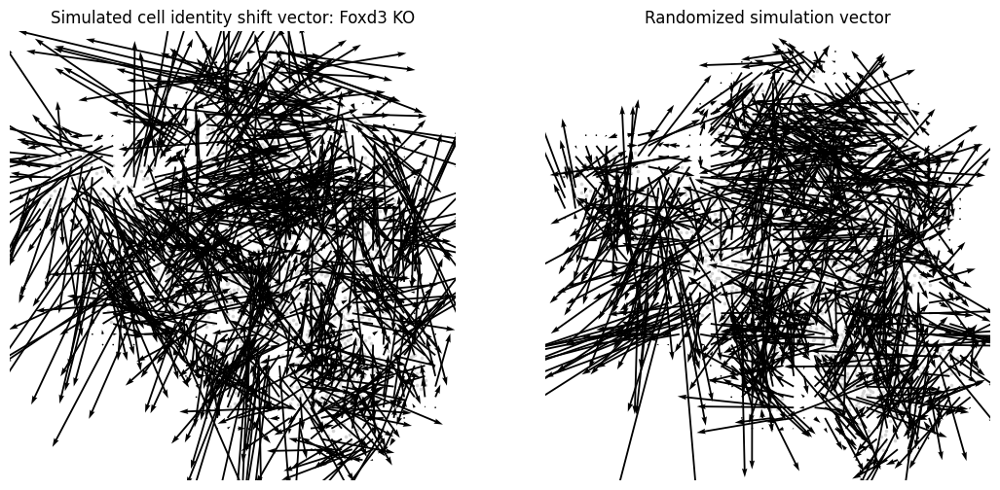

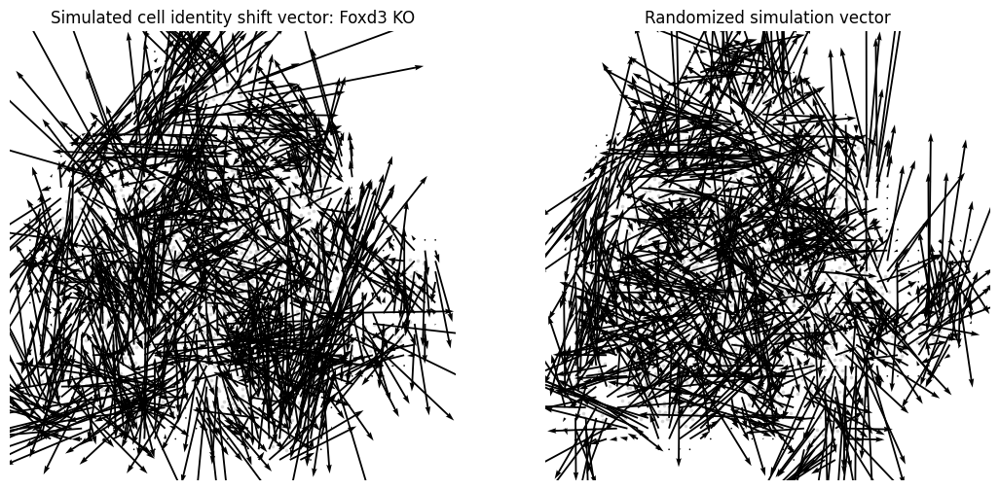

0
0
1
1
2
2
3
3


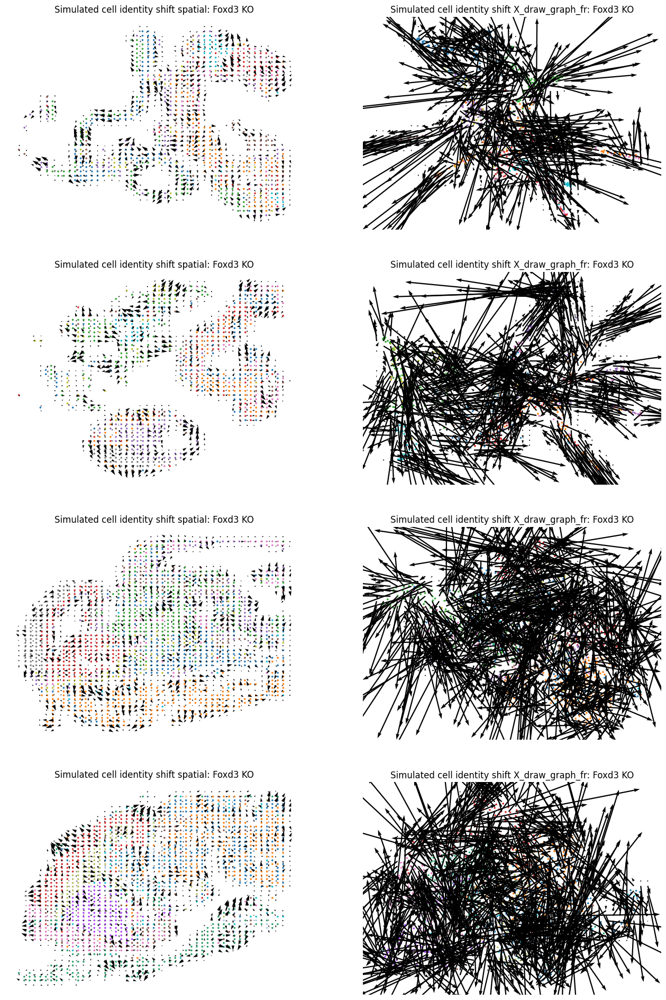

In [47]:
pl.paga_spatial_simulation(e2, ['Foxd3'], 'original_leiden')